# Facial vectors

Example of facial vectors manipulations


# Environment configuration

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="2" # GPU's to use

In [2]:
data_dir="/notebooks/datasets" # Directory where celeb_a data will be cached (because gdrive doesn't respond frequently)

# Read z-vectors


In [8]:
import pickle 
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow.keras.backend as K
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from tqdm import tqdm
import io

checkpoint = f"dfc_vae_epoch=4.model" 

vae_model = tf.keras.models.load_model(os.path.join("./pretrained_models", checkpoint))

attr_data = tfds.load("celeb_a", split=tfds.Split.TRAIN, data_dir=data_dir)

with open(f"./pretrained_models/dfc_vae_epoch=4_z_vectors.sample.pt", "rb") as f:
    z_vectors = pickle.load(f)

In [9]:
facial_attribute_names = attr_data.element_spec["attributes"].keys()
facial_attribute_names

dict_keys(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young'])

# Discover z-vectors

In [10]:
attr_data = tfds.load("celeb_a", split=tfds.Split.TRAIN, data_dir=data_dir)

In [11]:
import pandas as pd

def batch_to_frame(batch):
    mean =  pd.DataFrame.from_records([dict({"z_mean": v}) for v in batch["z_mean"].tolist()])
    attr = pd.DataFrame(batch["attributes"])
    return pd.merge(mean, attr, left_index=True, right_index=True)

z_vectors_pd = pd.concat([batch_to_frame(batch) for batch in z_vectors], axis=0) 


In [12]:
def get_mean_for_attribute(attribute_name):
    attribute = z_vectors_pd[attribute_name]
    def get_mean(filter):
        return np.mean(np.vstack(z_vectors_pd[filter].z_mean.to_numpy()), axis=0)
    positive = get_mean(attribute)
    negative = get_mean(~attribute)
    return positive - negative

In [13]:
facial_attributes_mean_vectors = dict([ (attribute, get_mean_for_attribute(attribute)) for attribute in tqdm(facial_attribute_names)])

100%|██████████| 40/40 [01:39<00:00,  2.48s/it]


In [49]:
def plot_attributes(z, attribute_vectors_dict=facial_attributes_mean_vectors, n=5, min_alpha=-1.2, max_alpha=1.2):
        
    for (idy, (attribute_name, attribute_vector)) in enumerate(tqdm(list(attribute_vectors_dict.items()))):
        fig = plt.figure(figsize=(30, 2))
        
        for (idx, alpha) in enumerate(np.linspace(min_alpha, max_alpha, n)):
            resp = vae_model.decoder(z + alpha * attribute_vector)
            ax = plt.subplot(1, n, idx + 1, title=f"{attribute_name}={alpha:.01f}") 
            plt.imshow(resp[0])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()


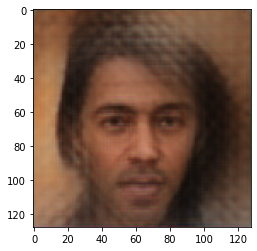

In [50]:
z = tf.random.normal ( shape=[1,100])
resp = vae_model.decoder(z)
plt.imshow(resp[0])
plt.show()


  0%|          | 0/40 [00:00<?, ?it/s]

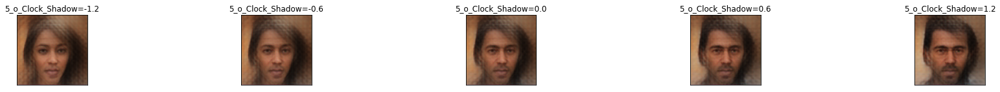

  2%|▎         | 1/40 [00:00<00:36,  1.07it/s]

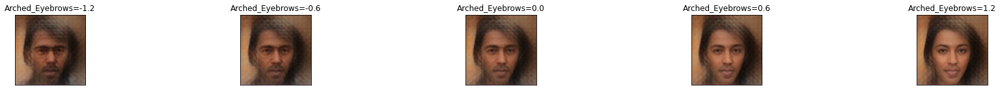

  5%|▌         | 2/40 [00:01<00:24,  1.55it/s]

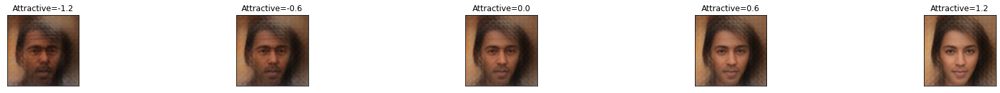

  8%|▊         | 3/40 [00:01<00:20,  1.84it/s]

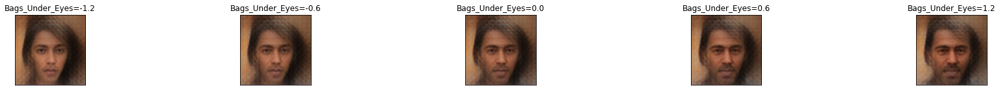

 10%|█         | 4/40 [00:02<00:18,  1.99it/s]

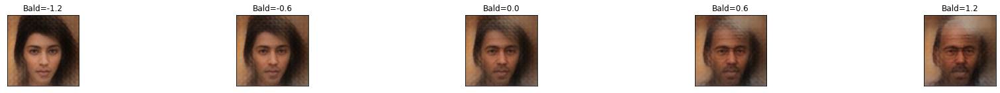

 12%|█▎        | 5/40 [00:02<00:16,  2.10it/s]

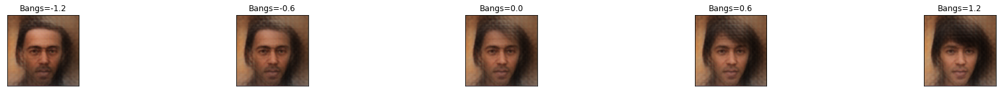

 15%|█▌        | 6/40 [00:03<00:15,  2.16it/s]

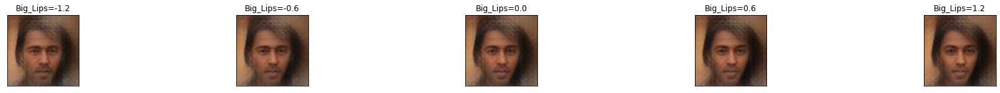

 18%|█▊        | 7/40 [00:03<00:14,  2.21it/s]

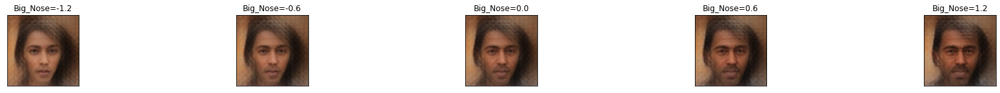

 20%|██        | 8/40 [00:03<00:14,  2.23it/s]

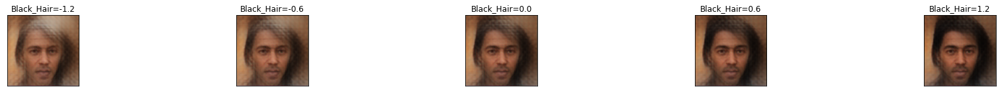

 22%|██▎       | 9/40 [00:04<00:13,  2.24it/s]

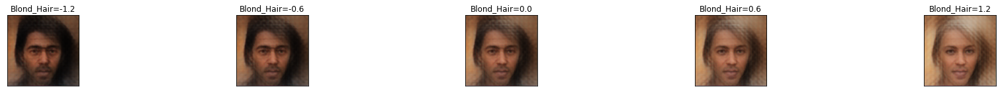

 25%|██▌       | 10/40 [00:04<00:13,  2.24it/s]

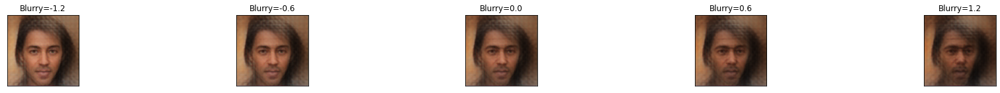

 28%|██▊       | 11/40 [00:05<00:12,  2.26it/s]

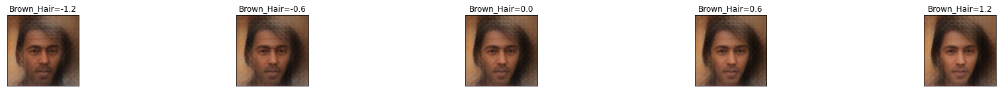

 30%|███       | 12/40 [00:06<00:17,  1.63it/s]

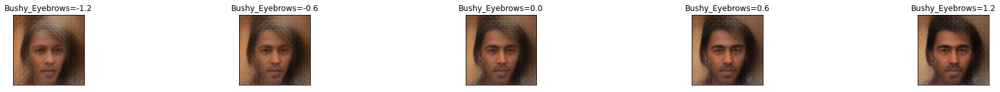

 32%|███▎      | 13/40 [00:06<00:15,  1.77it/s]

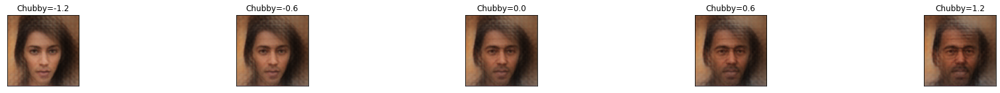

 35%|███▌      | 14/40 [00:07<00:13,  1.89it/s]

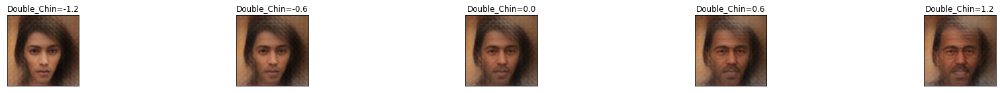

 38%|███▊      | 15/40 [00:07<00:12,  1.98it/s]

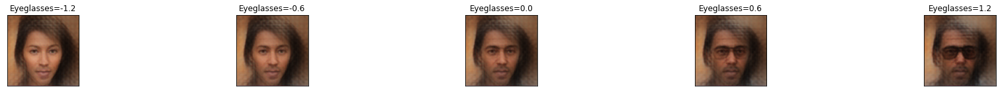

 40%|████      | 16/40 [00:08<00:11,  2.05it/s]

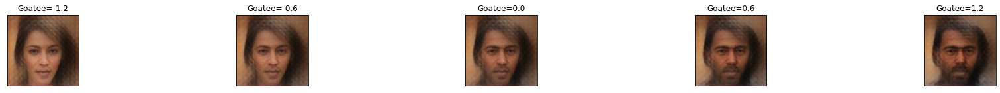

 42%|████▎     | 17/40 [00:08<00:10,  2.11it/s]

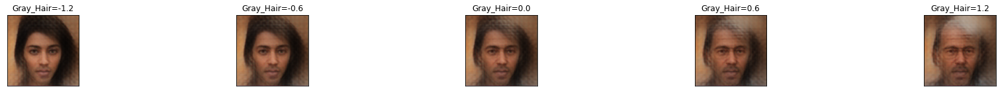

 45%|████▌     | 18/40 [00:08<00:10,  2.15it/s]

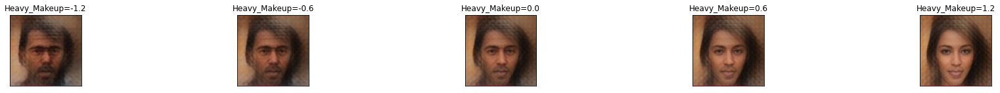

 48%|████▊     | 19/40 [00:09<00:09,  2.18it/s]

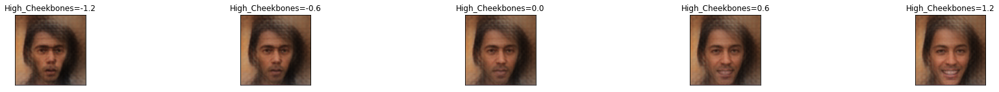

 50%|█████     | 20/40 [00:09<00:09,  2.21it/s]

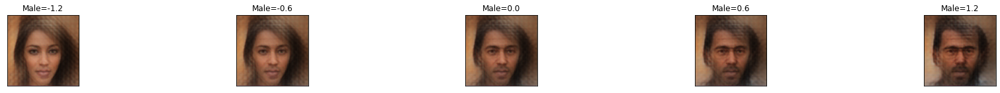

 52%|█████▎    | 21/40 [00:10<00:08,  2.24it/s]

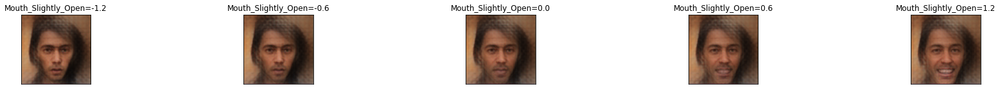

 55%|█████▌    | 22/40 [00:11<00:10,  1.69it/s]

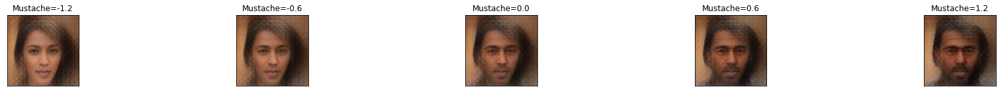

 57%|█████▊    | 23/40 [00:11<00:09,  1.83it/s]

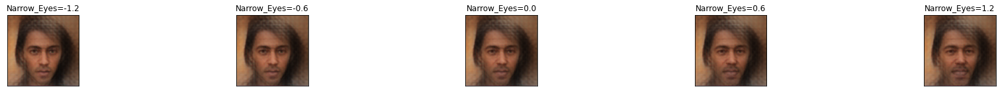

 60%|██████    | 24/40 [00:12<00:08,  1.94it/s]

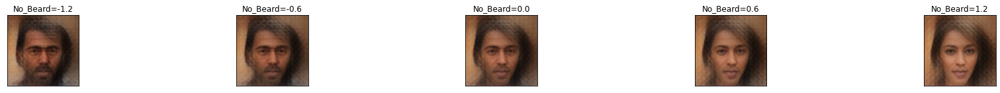

 62%|██████▎   | 25/40 [00:12<00:07,  2.04it/s]

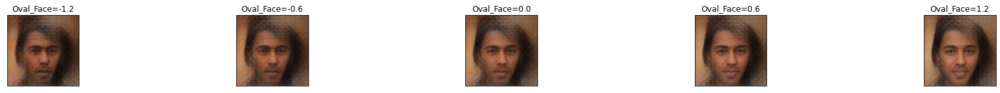

 65%|██████▌   | 26/40 [00:12<00:06,  2.12it/s]

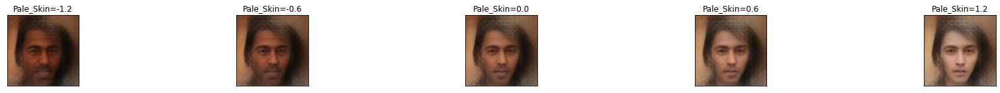

 68%|██████▊   | 27/40 [00:13<00:05,  2.17it/s]

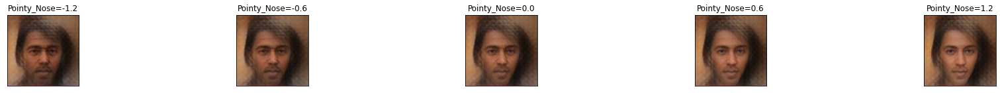

 70%|███████   | 28/40 [00:13<00:05,  2.21it/s]

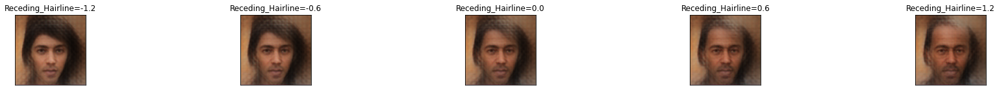

 72%|███████▎  | 29/40 [00:14<00:04,  2.22it/s]

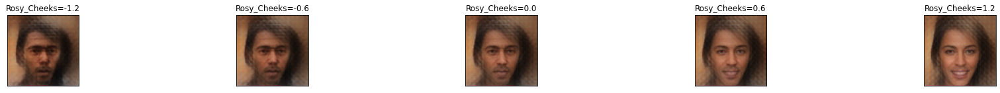

 75%|███████▌  | 30/40 [00:14<00:04,  2.24it/s]

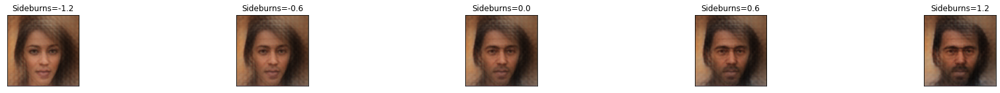

 78%|███████▊  | 31/40 [00:15<00:03,  2.26it/s]

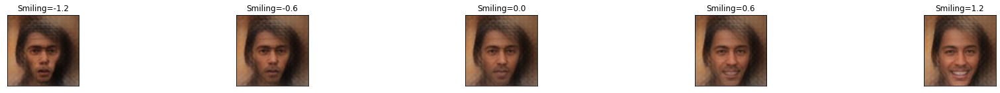

 80%|████████  | 32/40 [00:15<00:03,  2.27it/s]

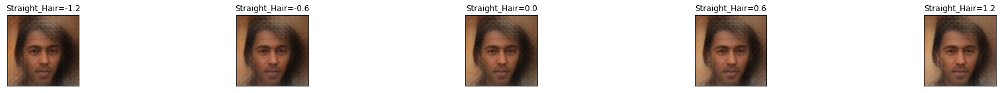

 82%|████████▎ | 33/40 [00:16<00:04,  1.63it/s]

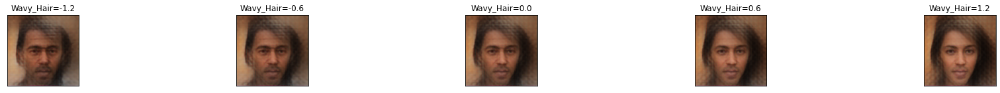

 85%|████████▌ | 34/40 [00:17<00:03,  1.78it/s]

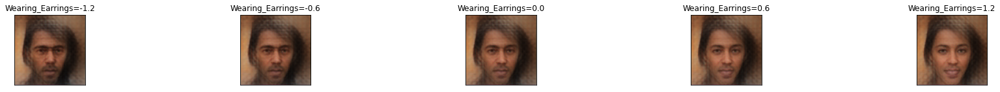

 88%|████████▊ | 35/40 [00:17<00:02,  1.90it/s]

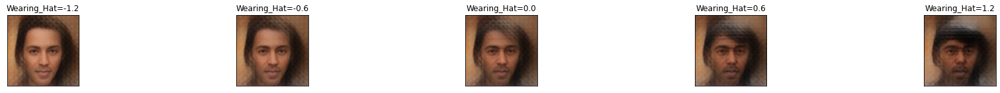

 90%|█████████ | 36/40 [00:17<00:01,  2.01it/s]

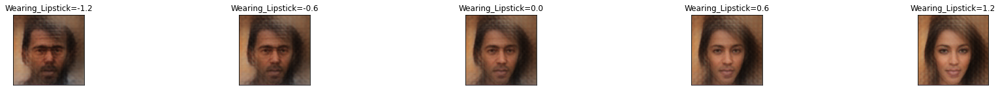

 92%|█████████▎| 37/40 [00:18<00:01,  2.08it/s]

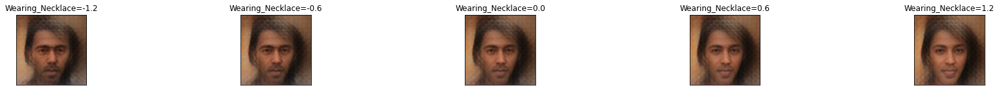

 95%|█████████▌| 38/40 [00:18<00:00,  2.14it/s]

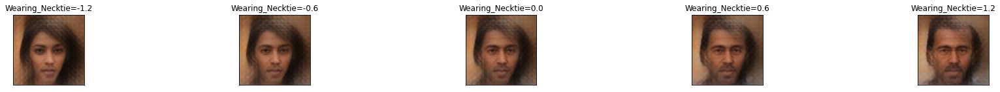

 98%|█████████▊| 39/40 [00:19<00:00,  2.18it/s]

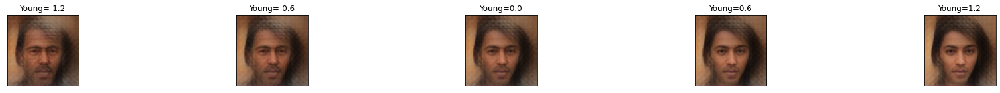

100%|██████████| 40/40 [00:19<00:00,  2.03it/s]


In [53]:


plot_attributes(z, n=5)

In [55]:
selected_attributes =[ 'Male',
                        'Smiling',
                        'Black_Hair',
                        
                        'Arched_Eyebrows',
                        'Bags_Under_Eyes',
                        'Bald',
                        #'Bangs',
                        #'Big_Lips',
                        #'Big_Nose',
                        #'Blond_Hair',

                        'Bushy_Eyebrows',
                        'Eyeglasses',
                        
                        'High_Cheekbones',
                        
                        'Mustache',
                        
                        'No_Beard',
                        'Oval_Face',
                        
                        'Pale_Skin']

                        
selected_attributes_dict = dict([ (k, facial_attributes_mean_vectors[k]) for k in selected_attributes])

plot_attributes(z, attribute_vectors_dict=selected_attributes_dict,  n=5)

  0%|          | 0/13 [00:00<?, ?it/s]

# Orthogonal attributes

In [51]:

def create_projection_matrix(B):
    """Compute the projection matrix onto the space spanned by the columns of `B`
    Args:
        B: ndarray of dimension (D, M), the basis for the subspace
    
    Returns:
        P: the projection matrix
    """
    P = B.dot(np.linalg.inv(B.T.dot(B))).dot(B.T)
    return P


def project(x, B):
    """Compute the projection matrix onto the space spanned by the columns of `B`
    Args:
        x: ndarray of dimension (D, 1), the vector to be projected
        B: ndarray of dimension (D, M), the basis for the subspace
    
    Returns:
        p: projection of x onto the subspac spanned by the columns of B; size (D, 1)
    """
    p = create_projection_matrix(B) @ x
    return p

def get_orthogonal_part(x, B):
    projection = project(x,B)
    return x - projection


selected_attributes_dict_orthogonal = {}

for attr_name, attr_vector in selected_attributes_dict.items():
    if len(selected_attributes_dict_orthogonal) == 0:
        orthogonal_part = attr_vector
    else:
        B = np.vstack([v for (k,v) in selected_attributes_dict_orthogonal.items()]).T
        orthogonal_part = get_orthogonal_part(attr_vector, B)
    selected_attributes_dict_orthogonal[attr_name] = orthogonal_part

  0%|          | 0/17 [00:00<?, ?it/s]

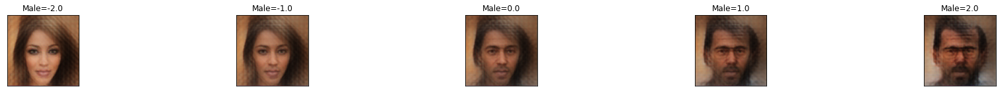

  6%|▌         | 1/17 [00:00<00:07,  2.25it/s]

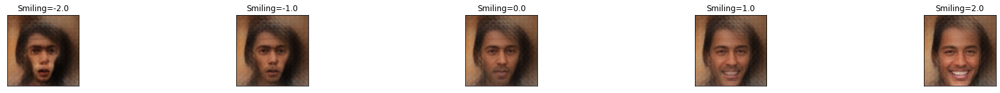

 12%|█▏        | 2/17 [00:00<00:06,  2.30it/s]

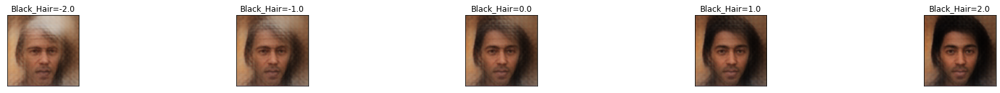

 18%|█▊        | 3/17 [00:01<00:06,  2.31it/s]

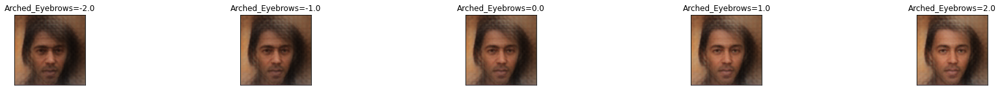

 24%|██▎       | 4/17 [00:01<00:05,  2.32it/s]

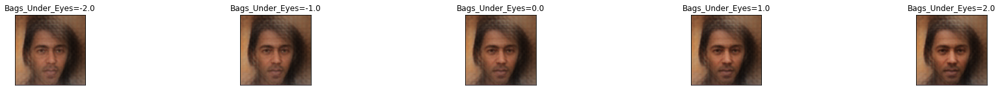

 29%|██▉       | 5/17 [00:02<00:05,  2.33it/s]

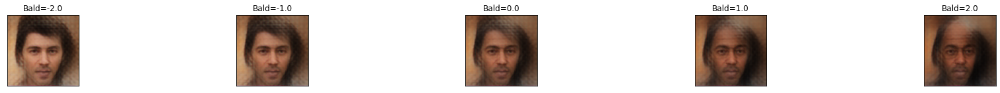

 35%|███▌      | 6/17 [00:02<00:04,  2.35it/s]

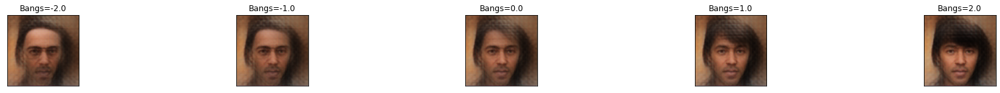

 41%|████      | 7/17 [00:02<00:04,  2.36it/s]

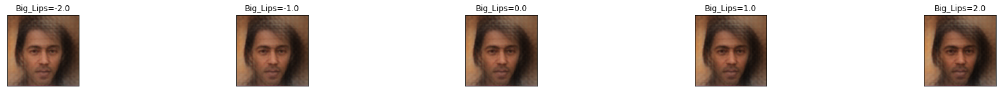

 47%|████▋     | 8/17 [00:03<00:05,  1.68it/s]

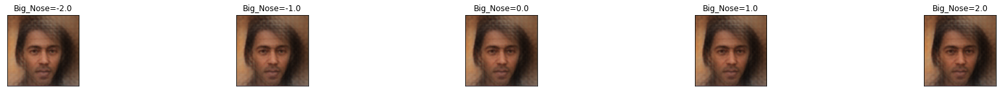

 53%|█████▎    | 9/17 [00:04<00:04,  1.85it/s]

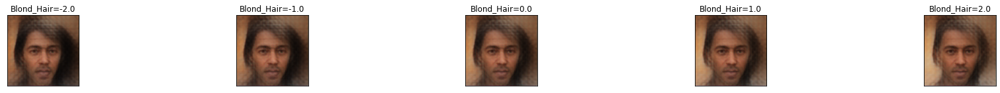

 59%|█████▉    | 10/17 [00:04<00:03,  1.98it/s]

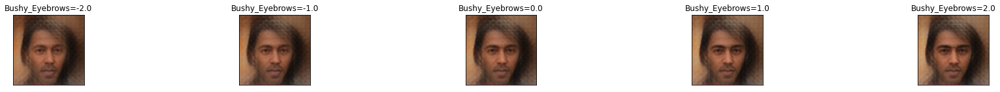

 65%|██████▍   | 11/17 [00:05<00:02,  2.08it/s]

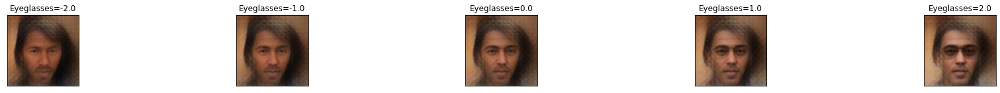

 71%|███████   | 12/17 [00:05<00:02,  2.16it/s]

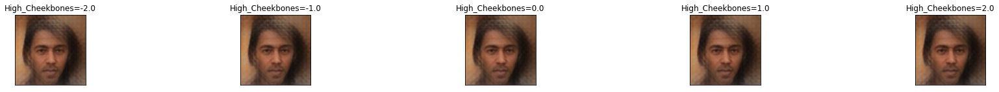

 76%|███████▋  | 13/17 [00:06<00:01,  2.22it/s]

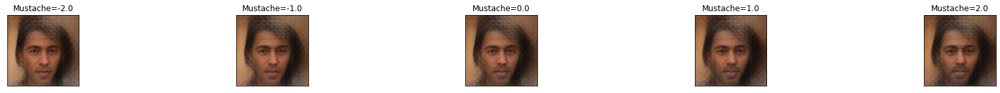

 82%|████████▏ | 14/17 [00:06<00:01,  2.26it/s]

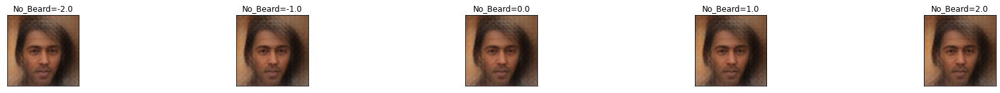

 88%|████████▊ | 15/17 [00:06<00:00,  2.30it/s]

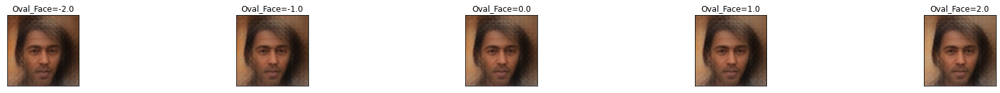

 94%|█████████▍| 16/17 [00:07<00:00,  2.33it/s]

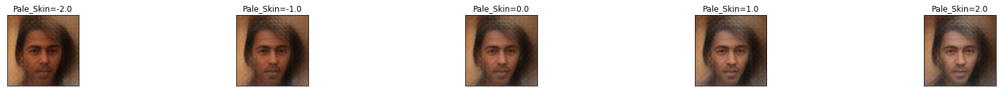

100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


In [52]:
plot_attributes(z, attribute_vectors_dict=selected_attributes_dict_orthogonal,  n=5, min_alpha=-2., max_alpha=2.)